In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
from matplotlib import gridspec
import numpy as np
import slab as s
reload(s)
import plot_chem
reload(plot_chem)
import cooling_utils as cu
reload(cu)
from matplotlib.colors import LogNorm
import matplotlib

Text(0,0.5,u'$\\log \\Lambda\\ (erg\\ s^{-1}cm^{3})$')

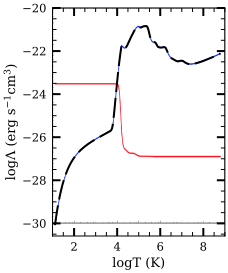

In [26]:
fn = "fig/SD93_KO2017.png"
img = plt.imread(fn)
fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(img, extent=[1, 9, -30, -20])
ax.plot(np.log10(SD93_temp), np.log10(SD93_cooling), "k--")
ax.set_xlabel("$\log T\ (K)$")
ax.set_ylabel("$\log \Lambda\ (erg\ s^{-1}cm^{3})$")

In [11]:
Zd = 0.1
dir_slab = "out_Z0p1_cooling/"
dir_out = "/Users/munangong/chemistry_Athena/PDR_cvode/"
slab = s.SlabOut(dir_out+dir_slab, Zd=Zd) 
slab.ReadRates()
slab.ReadThermo()
cooling = s.CoolingOut(dir_out+dir_slab, Zd=Zd) 
cooling.ReadThermo()

Set xC=1.60e-05, xO=3.20e-05.
Calculating E assuming CvCold and xHe=0.1 ...


In [14]:
def cooling_fire(T, n, Z, f_s=0.0):
    l = 2.896e-26 * ( (T/125.215)**(-4.9202) + (T/1349.86)**(-1.7288) + (T/6450.06)**(-0.3075) )**(-1) * (
           (1.0-f_s)*(1.+Z)/(1.+0.00143*n) ) * (0.001 + (0.1*n)/(1.+n) + (0.09*n)/(1.+0.1*n) + Z**2/(1.+n)
            ) * np.exp(-(T/158000.)**2)
    return l

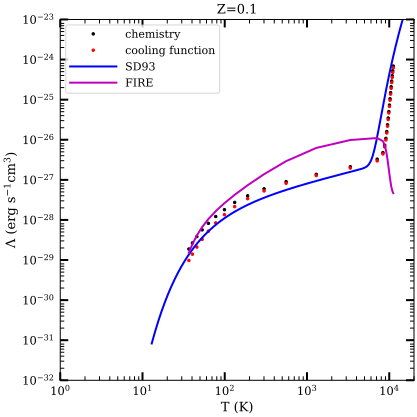

In [17]:
fig = plt.figure(figsize=[6, 6])
ax = fig.add_subplot(111)
plt.minorticks_on()
NH = slab.NH[0]
ax.plot(slab.GetAbd("T", NH=NH), (slab.GetAbd("Ltotal", NH=NH)/slab.nH), "k.", 
        label="chemistry", ms=5)
ax.plot(slab.GetAbd("T", NH=NH), (cooling.GetAbd("Ltotal", NH=NH)/slab.nH), "r.",
        label="cooling function", ms=5)
ax.plot(SD93_temp, SD93_cooling*Zd, "b-", label="SD93")
ax.plot(slab.GetAbd("T", NH=NH), cooling_fire(slab.GetAbd("T", NH=NH), slab.nH, Zd), "m-", label="FIRE")
ax.legend(markerscale=1)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("T (K)")
ax.set_ylabel("$\Lambda\ (erg\ s^{-1}cm^{3})$")
ax.set_xlim([1, 2e4])
ax.set_ylim([1e-32, 1e-23])
locmaj = matplotlib.ticker.LogLocator(base=10,numticks=12) 
ax.yaxis.set_major_locator(locmaj)
locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8),numticks=12)
ax.yaxis.set_minor_locator(locmin)
ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax.set_title("Z=0.1")
fig.savefig("fig/Z0p1_fire.png")

In [16]:
fig = plt.figure(figsize=[6, 6])
ax = fig.add_subplot(111)
plt.minorticks_on()
ax.plot(slab.GetAbd("T").reshape(-1), (slab.GetAbd("Ltotal")/slab.nHM).reshape(-1), "k.", 
        label="chemistry", ms=0.2)
ax.plot(slab.GetAbd("T").reshape(-1), (cooling.GetAbd("Ltotal")/slab.nHM).reshape(-1), "r.",
        label="cooling function", ms=0.2)
ax.plot(SD93_temp, SD93_cooling*Zd, "b-", label="SD93")
ax.legend(markerscale=20)
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlabel("T (K)")
ax.set_ylabel("$\Lambda\ (erg\ s^{-1}cm^{3})$")
ax.set_xlim([1, 2e4])
ax.set_ylim([1e-32, 1e-23])
locmaj = matplotlib.ticker.LogLocator(base=10,numticks=12) 
ax.yaxis.set_major_locator(locmaj)
locmin = matplotlib.ticker.LogLocator(base=10.0,subs=(0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8),numticks=12)
ax.yaxis.set_minor_locator(locmin)
ax.yaxis.set_minor_formatter(matplotlib.ticker.NullFormatter())
ax.set_title("Z=0.1")
fig.savefig("fig/Z0p1.png")

In [6]:
SD93_cooling = np.array([
         8.27861336e-31,   9.84438083e-31,   1.16632763e-30,
         1.37686216e-30,   1.61969658e-30,   1.89882491e-30,
         2.21859583e-30,   2.58372726e-30,   2.99931983e-30,
         3.47086897e-30,   4.00427560e-30,   4.60585512e-30,
         5.28234465e-30,   6.04090837e-30,   6.88914085e-30,
         7.83506828e-30,   8.88714751e-30,   1.00542629e-29,
         1.13457207e-29,   1.27712416e-29,   1.43409505e-29,
         1.60653644e-29,   1.79553777e-29,   2.00222459e-29,
         2.22775668e-29,   2.47332602e-29,   2.74015450e-29,
         3.02949157e-29,   3.34261167e-29,   3.68081149e-29,
         4.04540721e-29,   4.43773155e-29,   4.85913079e-29,
         5.31096166e-29,   5.79458826e-29,   6.31137890e-29,
         6.86270298e-29,   7.44992776e-29,   8.07441533e-29,
         8.73751949e-29,   9.44058274e-29,   1.01849333e-28,
         1.09718824e-28,   1.18027213e-28,   1.26787188e-28,
         1.36011188e-28,   1.45711378e-28,   1.55899626e-28,
         1.66587485e-28,   1.77786172e-28,   1.89506548e-28,
         2.01759109e-28,   2.14553966e-28,   2.27900832e-28,
         2.41809017e-28,   2.56287413e-28,   2.71344490e-28,
         2.86988290e-28,   3.03226423e-28,   3.20066063e-28,
         3.37513947e-28,   3.55576381e-28,   3.74259233e-28,
         3.93567946e-28,   4.13507536e-28,   4.34082599e-28,
         4.55297322e-28,   4.77155486e-28,   4.99660481e-28,
         5.22815310e-28,   5.46622605e-28,   5.71084634e-28,
         5.96203321e-28,   6.21980251e-28,   6.48416688e-28,
         6.75513588e-28,   7.03271614e-28,   7.31691153e-28,
         7.60772326e-28,   7.90515007e-28,   8.20918838e-28,
         8.51983246e-28,   8.83707454e-28,   9.16090503e-28,
         9.49131263e-28,   9.82828448e-28,   1.01718063e-27,
         1.05218628e-27,   1.08784372e-27,   1.12415121e-27,
         1.16110692e-27,   1.19870895e-27,   1.23695535e-27,
         1.27584414e-27,   1.31537331e-27,   1.35554082e-27,
         1.39634465e-27,   1.43778279e-27,   1.47985324e-27,
         1.52255404e-27,   1.56588327e-27,   1.60983907e-27,
         1.65441965e-27,   1.69962328e-27,   1.74544830e-27,
         1.79189318e-27,   1.83895645e-27,   1.88663675e-27,
         1.93493287e-27,   1.98384367e-27,   2.03336817e-27,
         2.08350550e-27,   2.13425495e-27,   2.18561594e-27,
         2.23758803e-27,   2.29017096e-27,   2.34336459e-27,
         2.39716897e-27,   2.45158431e-27,   2.50661097e-27,
         2.56224950e-27,   2.61850063e-27,   2.67536523e-27,
         2.73284439e-27,   2.79093935e-27,   2.84965156e-27,
         2.90898264e-27,   2.96893438e-27,   3.02950879e-27,
         3.09070804e-27,   3.15253450e-27,   3.21499074e-27,
         3.27807951e-27,   3.34180374e-27,   3.40616657e-27,
         3.47117132e-27,   3.53682152e-27,   3.60312086e-27,
         3.67007325e-27,   3.73768278e-27,   3.80595373e-27,
         3.87489058e-27,   3.94449798e-27,   4.01478081e-27,
         4.08574409e-27,   4.15739307e-27,   4.22973317e-27,
         4.30276999e-27,   4.37650936e-27,   4.45095724e-27,
         4.52611981e-27,   4.60200344e-27,   4.67861467e-27,
         4.75596024e-27,   4.83404705e-27,   4.91288221e-27,
         4.99247300e-27,   5.07282688e-27,   5.15395151e-27,
         5.23585471e-27,   5.31854449e-27,   5.40202904e-27,
         5.48631673e-27,   5.57141612e-27,   5.65733592e-27,
         5.74408505e-27,   5.83167259e-27,   5.92010782e-27,
         6.00940016e-27,   6.09955924e-27,   6.19059486e-27,
         6.28251699e-27,   6.37533578e-27,   6.46906155e-27,
         6.56370483e-27,   6.65927627e-27,   6.75578676e-27,
         6.85324731e-27,   6.95166915e-27,   7.05106366e-27,
         7.15144242e-27,   7.25281716e-27,   7.35519982e-27,
         7.45860249e-27,   7.56303747e-27,   7.66851720e-27,
         7.77505433e-27,   7.88266168e-27,   7.99135226e-27,
         8.10113925e-27,   8.21203601e-27,   8.32405610e-27,
         8.43721326e-27,   8.55152139e-27,   8.66699461e-27,
         8.78364720e-27,   8.90149365e-27,   9.02054863e-27,
         9.14082698e-27,   9.26234377e-27,   9.38511422e-27,
         9.50915377e-27,   9.63447806e-27,   9.76110290e-27,
         9.88904431e-27,   1.00183185e-26,   1.01489419e-26,
         1.02809312e-26,   1.04143031e-26,   1.05490747e-26,
         1.06852632e-26,   1.08228861e-26,   1.09619610e-26,
         1.11025058e-26,   1.12445385e-26,   1.13880775e-26,
         1.15331412e-26,   1.16797484e-26,   1.18279181e-26,
         1.19776693e-26,   1.21290215e-26,   1.22819943e-26,
         1.24366076e-26,   1.25928814e-26,   1.27508361e-26,
         1.29104923e-26,   1.30718706e-26,   1.32349922e-26,
         1.33998783e-26,   1.35665506e-26,   1.37350308e-26,
         1.39053410e-26,   1.40775038e-26,   1.42515420e-26,
         1.44274788e-26,   1.46053381e-26,   1.47851447e-26,
         1.49669242e-26,   1.51507043e-26,   1.53365147e-26,
         1.55243889e-26,   1.57143662e-26,   1.59064942e-26,
         1.61008335e-26,   1.62974644e-26,   1.64964973e-26,
         1.66980870e-26,   1.69024560e-26,   1.71099262e-26,
         1.73209675e-26,   1.75362661e-26,   1.77568243e-26,
         1.79841020e-26,   1.82202172e-26,   1.84682291e-26,
         1.87325326e-26,   1.90194061e-26,   1.93377662e-26,
         1.97002002e-26,   2.01239494e-26,   2.06343864e-26,
         2.12652754e-26,   2.20636049e-26,   2.30936917e-26,
         2.44430303e-26,   2.62299177e-26,   2.86133264e-26,
         3.18056004e-26,   3.60886737e-26,   4.18346505e-26,
         4.95317461e-26,   5.98167714e-26,   7.35155430e-26,
         9.16928260e-26,   1.15713657e-25,   1.47318156e-25,
         1.88712204e-25,   2.42676653e-25,   3.12698013e-25,
         4.03123856e-25,   5.19346428e-25,   6.68018239e-25,
         8.57303603e-25,   1.09717027e-24,   1.39972545e-24,
         1.77960053e-24,   2.25438881e-24,   2.84514042e-24,
         3.57691836e-24,   4.46053923e-24,   5.46221024e-24,
         6.66658392e-24,   8.10967730e-24,   9.83271899e-24,
         1.18827258e-23,   1.38602106e-23,   1.59650387e-23,
         1.83490204e-23,   2.10483138e-23,   2.40908297e-23,
         2.75123688e-23,   3.13622091e-23,   3.47241608e-23,
         3.77617820e-23,   4.10104231e-23,   4.44863662e-23,
         4.81835534e-23,   5.21407672e-23,   5.63280497e-23,
         6.08078050e-23,   6.55399122e-23,   7.05710369e-23,
         7.58934314e-23,   8.13225145e-23,   8.66172016e-23,
         9.21307756e-23,   9.79193516e-23,   1.03966908e-22,
         1.10244503e-22,   1.16841744e-22,   1.23687819e-22,
         1.30782628e-22,   1.38219891e-22,   1.45904157e-22,
         1.53858641e-22,   1.62161826e-22,   1.70717025e-22,
         1.77395242e-22,   1.75492147e-22,   1.73630535e-22,
         1.71790488e-22,   1.69992326e-22,   1.68215079e-22,
         1.66476219e-22,   1.64761868e-22,   1.63080088e-22,
         1.61426973e-22,   1.59800136e-22,   1.58054183e-22,
         1.55631023e-22,   1.53250651e-22,   1.50915500e-22,
         1.48619247e-22,   1.46363346e-22,   1.44150369e-22,
         1.41973860e-22,   1.40530551e-22,   1.39449834e-22,
         1.38378199e-22,   1.37315571e-22,   1.36261432e-22,
         1.35215824e-22,   1.36068360e-22,   1.37778565e-22,
         1.39509855e-22,   1.41262485e-22,   1.43036709e-22,
         1.45205142e-22,   1.49405311e-22,   1.53726630e-22,
         1.58171721e-22,   1.62743722e-22,   1.67446201e-22,
         1.73730573e-22,   1.81734625e-22,   1.90104706e-22,
         1.98857412e-22,   2.08010086e-22,   2.17583916e-22,
         2.27135941e-22,   2.37040300e-22,   2.47375135e-22,
         2.58159091e-22,   2.69411614e-22,   2.82026126e-22,
         2.96217343e-22,   3.11122300e-22,   3.26776875e-22,
         3.43218750e-22,   3.60622368e-22,   3.79208782e-22,
         3.98753107e-22,   4.19304711e-22,   4.40915506e-22,
         4.63040591e-22,   4.84686014e-22,   5.07343246e-22,
         5.31059582e-22,   5.55884528e-22,   5.81819442e-22,
         6.08798019e-22,   6.37027406e-22,   6.66565588e-22,
         6.97473235e-22,   7.29199579e-22,   7.59079048e-22,
         7.90182121e-22,   8.22558874e-22,   8.56261433e-22,
         8.91331234e-22,   9.22724102e-22,   9.55219787e-22,
         9.88856799e-22,   1.02367511e-21,   1.05971607e-21,
         1.08988776e-21,   1.11746963e-21,   1.14574284e-21,
         1.17472453e-21,   1.20443226e-21,   1.23341304e-21,
         1.25458780e-21,   1.27612349e-21,   1.29802830e-21,
         1.32030587e-21,   1.34296246e-21,   1.34896288e-21,
         1.34896288e-21,   1.34896288e-21,   1.34896288e-21,
         1.34896288e-21,   1.34003400e-21,   1.32194733e-21,
         1.30410489e-21,   1.28650337e-21,   1.26913954e-21,
         1.25661610e-21,   1.25093706e-21,   1.24528372e-21,
         1.23965597e-21,   1.23405368e-21,   1.23392033e-21,
         1.24533766e-21,   1.25686062e-21,   1.26849021e-21,
         1.28022741e-21,   1.29394196e-21,   1.31179220e-21,
         1.32988866e-21,   1.34823473e-21,   1.36683386e-21,
         1.38216510e-21,   1.38854488e-21,   1.39495411e-21,
         1.40139293e-21,   1.40786146e-21,   1.41435986e-21,
         1.42088824e-21,   1.42744677e-21,   1.43403556e-21,
         1.44065477e-21,   1.44543977e-21,   1.44543977e-21,
         1.44543977e-21,   1.44543977e-21,   1.44543977e-21,
         1.43990573e-21,   1.42031234e-21,   1.40098560e-21,
         1.38192187e-21,   1.36311758e-21,   1.32841317e-21,
         1.24546972e-21,   1.16770509e-21,   1.09479593e-21,
         1.02643907e-21,   9.53945488e-22,   8.62032338e-22,
         7.78975068e-22,   7.03920411e-22,   6.36097309e-22,
         5.76070932e-22,   5.25382934e-22,   4.79154931e-22,
         4.36994491e-22,   3.98543712e-22,   3.67117352e-22,
         3.49130418e-22,   3.32024781e-22,   3.15757260e-22,
         3.00286788e-22,   2.87362698e-22,   2.82117738e-22,
         2.76968509e-22,   2.71913264e-22,   2.66950288e-22,
         2.62789252e-22,   2.61581845e-22,   2.60379985e-22,
         2.59183648e-22,   2.57992807e-22,   2.57039578e-22,
         2.57039578e-22,   2.57039578e-22,   2.57039578e-22,
         2.57039578e-22,   2.56372241e-22,   2.50536496e-22,
         2.44833589e-22,   2.39260496e-22,   2.33814262e-22,
         2.27898779e-22,   2.17641644e-22,   2.07846157e-22,
         1.98491539e-22,   1.89557948e-22,   1.81309015e-22,
         1.75557505e-22,   1.69988444e-22,   1.64596046e-22,
         1.59374707e-22,   1.54720692e-22,   1.53302204e-22,
         1.51896721e-22,   1.50504124e-22,   1.49124294e-22,
         1.47833956e-22,   1.47154721e-22,   1.46478607e-22,
         1.45805598e-22,   1.45135683e-22,   1.44543977e-22,
         1.44543977e-22,   1.44543977e-22,   1.44543977e-22,
         1.44543977e-22,   1.44619149e-22,   1.45286680e-22,
         1.45957293e-22,   1.46631001e-22,   1.47307819e-22,
         1.47987761e-22,   1.48670842e-22,   1.49357075e-22,
         1.50046476e-22,   1.50739059e-22,   1.51356125e-22,
         1.51356125e-22,   1.51356125e-22,   1.51356125e-22,
         1.51356125e-22,   1.51120228e-22,   1.49046781e-22,
         1.47001782e-22,   1.44984842e-22,   1.42995575e-22,
         1.40521248e-22,   1.34196750e-22,   1.28156901e-22,
         1.22388891e-22,   1.16880483e-22,   1.11446029e-22,
         1.04969855e-22,   9.88700146e-23,   9.31246381e-23,
         8.77131278e-23,   8.27020354e-23,   7.86169513e-23,
         7.47336508e-23,   7.10421667e-23,   6.75330242e-23,
         6.42974277e-23,   6.19717270e-23,   5.97301491e-23,
         5.75696513e-23,   5.54873008e-23,   5.35637531e-23,
         5.23444932e-23,   5.11529871e-23,   4.99886029e-23,
         4.88507234e-23,   4.77884120e-23,   4.71327304e-23,
         4.64860451e-23,   4.58482327e-23,   4.52191714e-23,
         4.45987411e-23,   4.39868234e-23,   4.33833016e-23,
         4.27880603e-23,   4.22009861e-23,   4.16219669e-23,
         4.10508921e-23,   4.04876528e-23,   3.99321413e-23,
         3.93842518e-23,   3.88438796e-23,   3.83109216e-23,
         3.77852761e-23,   3.72668426e-23,   3.67555224e-23,
         3.62700705e-23,   3.59375445e-23,   3.56080671e-23,
         3.52816104e-23,   3.49581466e-23,   3.46376484e-23,
         3.43200885e-23,   3.40054401e-23,   3.36936763e-23,
         3.33847709e-23,   3.31131121e-23,   3.31131121e-23,
         3.31131121e-23,   3.31131121e-23,   3.31131121e-23,
         3.31475627e-23,   3.34542733e-23,   3.37638219e-23,
         3.40762347e-23,   3.43915382e-23,   3.46917174e-23,
         3.48518471e-23,   3.50127159e-23,   3.51743273e-23,
         3.53366846e-23,   3.54813389e-23,   3.54813389e-23,
         3.54813389e-23,   3.54813389e-23,   3.54813389e-23,
         3.54628961e-23,   3.52999589e-23,   3.51377703e-23,
         3.49763269e-23,   3.48156253e-23,   3.46196442e-23,
         3.41446448e-23,   3.36761627e-23,   3.32141085e-23,
         3.27583938e-23,   3.22921380e-23,   3.17027400e-23,
         3.11240998e-23,   3.05560210e-23,   2.99983107e-23,
         2.94660960e-23,   2.90618060e-23,   2.86630631e-23,
         2.82697911e-23,   2.78819150e-23,   2.75136621e-23,
         2.72614154e-23,   2.70114812e-23,   2.67638384e-23,
         2.65184661e-23,   2.62753433e-23,   2.60344495e-23,
         2.57957643e-23,   2.55592673e-23,   2.53249385e-23,
         2.51058078e-23,   2.49904571e-23,   2.48756364e-23,
         2.47613432e-23,   2.46475752e-23,   2.45470892e-23,
         2.45470892e-23,   2.45470892e-23,   2.45470892e-23,
         2.45470892e-23,   2.45470892e-23,   2.45470892e-23,
         2.45470892e-23,   2.45470892e-23,   2.45470892e-23,
         2.45598551e-23,   2.46732182e-23,   2.47871046e-23,
         2.49015167e-23,   2.50164569e-23,   2.51188643e-23,
         2.51188643e-23,   2.51188643e-23,   2.51188643e-23,
         2.51188643e-23,   2.51319276e-23,   2.52479313e-23,
         2.53644705e-23,   2.54815476e-23,   2.55991650e-23,
         2.57306999e-23,   2.59687832e-23,   2.62090694e-23,
         2.64515789e-23,   2.66963323e-23,   2.69293456e-23,
         2.70536458e-23,   2.71785198e-23,   2.73039701e-23,
         2.74299995e-23,   2.75709417e-23,   2.78260525e-23,
         2.80835238e-23,   2.83433774e-23,   2.86056355e-23,
         2.88553137e-23,   2.89885038e-23,   2.91223086e-23,
         2.92567311e-23,   2.93917740e-23,   2.95427963e-23,
         2.98161524e-23,   3.00920379e-23,   3.03704761e-23,
         3.06514907e-23,   3.09351054e-23,   3.12213444e-23,
         3.15102320e-23,   3.18017926e-23,   3.20960509e-23,
         3.23761945e-23,   3.25256362e-23,   3.26757677e-23,
         3.28265922e-23,   3.29781129e-23,   3.31475627e-23,
         3.34542733e-23,   3.37638219e-23,   3.40762347e-23,
         3.43915382e-23,   3.47097592e-23,   3.50309246e-23,
         3.53550618e-23,   3.56821981e-23,   3.60123614e-23,
         3.63455797e-23,   3.66818812e-23,   3.70212945e-23,
         3.73638483e-23,   3.77095717e-23,   3.80584941e-23,
         3.84106450e-23,   3.87660543e-23,   3.91247522e-23,
         3.94867691e-23,   3.98521357e-23,   4.02208830e-23,
         4.05930422e-23,   4.09686450e-23,   4.13477232e-23,
         4.17303090e-23,   4.21164348e-23,   4.25061333e-23,
         4.28994378e-23,   4.32963814e-23,   4.36969978e-23,
         4.41013212e-23,   4.45093857e-23,   4.49212260e-23,
         4.53368770e-23,   4.57563739e-23,   4.61797524e-23,
         4.66070484e-23,   4.70382981e-23,   4.74735381e-23,
         4.79128054e-23,   4.83561371e-23,   4.88035709e-23,
         4.92551448e-23,   4.97108971e-23,   5.01708663e-23,
         5.06350916e-23,   5.11036124e-23,   5.15764683e-23,
         5.20536995e-23,   5.25353464e-23,   5.30214500e-23,
         5.35120514e-23,   5.40071923e-23,   5.45069147e-23,
         5.50132889e-23,   5.55444336e-23,   5.60879502e-23,
         5.66441270e-23,   5.72132587e-23,   5.77956473e-23,
         5.83916014e-23,   5.90014371e-23,   5.96254776e-23,
         6.02640540e-23,   6.09175047e-23,   6.15861762e-23,
         6.22704231e-23,   6.29706081e-23,   6.36871025e-23,
         6.44202863e-23,   6.51705481e-23,   6.59382857e-23,
         6.67239062e-23,   6.75278262e-23,   6.83504719e-23,
         6.91922794e-23,   7.00536952e-23,   7.09351760e-23,
         7.18371890e-23,   7.27602127e-23,   7.37047363e-23,
         7.46712607e-23,   7.56602983e-23,   7.66723736e-23])
SD93_temp = np.array([
         1.29500000e+01,   1.32516443e+01,   1.35603147e+01,
         1.38761750e+01,   1.41993926e+01,   1.45301390e+01,
         1.48685894e+01,   1.52149233e+01,   1.55693244e+01,
         1.59319806e+01,   1.63030841e+01,   1.66828317e+01,
         1.70714248e+01,   1.74690693e+01,   1.78759762e+01,
         1.82923612e+01,   1.87184450e+01,   1.91544536e+01,
         1.96006182e+01,   2.00571752e+01,   2.05243668e+01,
         2.10024408e+01,   2.14916505e+01,   2.19922553e+01,
         2.25045207e+01,   2.30287184e+01,   2.35651261e+01,
         2.41140284e+01,   2.46757163e+01,   2.52504876e+01,
         2.58386470e+01,   2.64405064e+01,   2.70563849e+01,
         2.76866091e+01,   2.83315130e+01,   2.89914387e+01,
         2.96667361e+01,   3.03577632e+01,   3.10648863e+01,
         3.17884805e+01,   3.25289293e+01,   3.32866254e+01,
         3.40619705e+01,   3.48553757e+01,   3.56672617e+01,
         3.64980590e+01,   3.73482080e+01,   3.82181595e+01,
         3.91083748e+01,   4.00193259e+01,   4.09514957e+01,
         4.19053786e+01,   4.28814802e+01,   4.38803182e+01,
         4.49024221e+01,   4.59483339e+01,   4.70186081e+01,
         4.81138122e+01,   4.92345268e+01,   5.03813463e+01,
         5.15548786e+01,   5.27557460e+01,   5.39845852e+01,
         5.52420477e+01,   5.65288003e+01,   5.78455252e+01,
         5.91929206e+01,   6.05717008e+01,   6.19825970e+01,
         6.34263571e+01,   6.49037468e+01,   6.64155492e+01,
         6.79625661e+01,   6.95456176e+01,   7.11655432e+01,
         7.28232016e+01,   7.45194719e+01,   7.62552534e+01,
         7.80314664e+01,   7.98490527e+01,   8.17089761e+01,
         8.36122227e+01,   8.55598015e+01,   8.75527453e+01,
         8.95921107e+01,   9.16789791e+01,   9.38144568e+01,
         9.59996762e+01,   9.82357960e+01,   1.00524002e+02,
         1.02865506e+02,   1.05261552e+02,   1.07713408e+02,
         1.10222376e+02,   1.12789785e+02,   1.15416996e+02,
         1.18105404e+02,   1.20856432e+02,   1.23671540e+02,
         1.26552220e+02,   1.29500000e+02,   1.32516443e+02,
         1.35603147e+02,   1.38761750e+02,   1.41993926e+02,
         1.45301390e+02,   1.48685894e+02,   1.52149233e+02,
         1.55693244e+02,   1.59319806e+02,   1.63030841e+02,
         1.66828317e+02,   1.70714248e+02,   1.74690693e+02,
         1.78759762e+02,   1.82923612e+02,   1.87184450e+02,
         1.91544536e+02,   1.96006182e+02,   2.00571752e+02,
         2.05243668e+02,   2.10024408e+02,   2.14916505e+02,
         2.19922553e+02,   2.25045207e+02,   2.30287184e+02,
         2.35651261e+02,   2.41140284e+02,   2.46757163e+02,
         2.52504876e+02,   2.58386470e+02,   2.64405064e+02,
         2.70563849e+02,   2.76866091e+02,   2.83315130e+02,
         2.89914387e+02,   2.96667361e+02,   3.03577632e+02,
         3.10648863e+02,   3.17884805e+02,   3.25289293e+02,
         3.32866254e+02,   3.40619705e+02,   3.48553757e+02,
         3.56672617e+02,   3.64980590e+02,   3.73482080e+02,
         3.82181595e+02,   3.91083748e+02,   4.00193259e+02,
         4.09514957e+02,   4.19053786e+02,   4.28814802e+02,
         4.38803182e+02,   4.49024221e+02,   4.59483339e+02,
         4.70186081e+02,   4.81138122e+02,   4.92345268e+02,
         5.03813463e+02,   5.15548786e+02,   5.27557460e+02,
         5.39845852e+02,   5.52420477e+02,   5.65288003e+02,
         5.78455252e+02,   5.91929206e+02,   6.05717008e+02,
         6.19825970e+02,   6.34263571e+02,   6.49037468e+02,
         6.64155492e+02,   6.79625661e+02,   6.95456176e+02,
         7.11655432e+02,   7.28232016e+02,   7.45194719e+02,
         7.62552534e+02,   7.80314664e+02,   7.98490527e+02,
         8.17089761e+02,   8.36122227e+02,   8.55598015e+02,
         8.75527453e+02,   8.95921107e+02,   9.16789791e+02,
         9.38144568e+02,   9.59996762e+02,   9.82357960e+02,
         1.00524002e+03,   1.02865506e+03,   1.05261552e+03,
         1.07713408e+03,   1.10222376e+03,   1.12789785e+03,
         1.15416996e+03,   1.18105404e+03,   1.20856432e+03,
         1.23671540e+03,   1.26552220e+03,   1.29500000e+03,
         1.32516443e+03,   1.35603147e+03,   1.38761750e+03,
         1.41993926e+03,   1.45301390e+03,   1.48685894e+03,
         1.52149233e+03,   1.55693244e+03,   1.59319806e+03,
         1.63030841e+03,   1.66828317e+03,   1.70714248e+03,
         1.74690693e+03,   1.78759762e+03,   1.82923612e+03,
         1.87184450e+03,   1.91544536e+03,   1.96006182e+03,
         2.00571752e+03,   2.05243668e+03,   2.10024408e+03,
         2.14916505e+03,   2.19922553e+03,   2.25045207e+03,
         2.30287184e+03,   2.35651261e+03,   2.41140284e+03,
         2.46757163e+03,   2.52504876e+03,   2.58386470e+03,
         2.64405064e+03,   2.70563849e+03,   2.76866091e+03,
         2.83315130e+03,   2.89914387e+03,   2.96667361e+03,
         3.03577632e+03,   3.10648863e+03,   3.17884805e+03,
         3.25289293e+03,   3.32866254e+03,   3.40619705e+03,
         3.48553757e+03,   3.56672617e+03,   3.64980590e+03,
         3.73482080e+03,   3.82181595e+03,   3.91083748e+03,
         4.00193259e+03,   4.09514957e+03,   4.19053786e+03,
         4.28814802e+03,   4.38803182e+03,   4.49024221e+03,
         4.59483339e+03,   4.70186081e+03,   4.81138122e+03,
         4.92345268e+03,   5.03802949e+03,   5.15538027e+03,
         5.27546451e+03,   5.39834586e+03,   5.52408949e+03,
         5.65276206e+03,   5.78443181e+03,   5.91916853e+03,
         6.05704368e+03,   6.19813035e+03,   6.34250335e+03,
         6.49023923e+03,   6.64141633e+03,   6.79611479e+03,
         6.95441663e+03,   7.11640581e+03,   7.28216819e+03,
         7.45179168e+03,   7.62536621e+03,   7.80298380e+03,
         7.98473864e+03,   8.17072710e+03,   8.36104778e+03,
         8.55580160e+03,   8.75509183e+03,   8.95902411e+03,
         9.16770659e+03,   9.38124991e+03,   9.59976729e+03,
         9.82337460e+03,   1.00478087e+04,   1.02618409e+04,
         1.04803924e+04,   1.07035803e+04,   1.09314980e+04,
         1.11642261e+04,   1.13601284e+04,   1.15456386e+04,
         1.17337325e+04,   1.19247839e+04,   1.21183694e+04,
         1.23145033e+04,   1.25137280e+04,   1.26727841e+04,
         1.28066003e+04,   1.29408632e+04,   1.30757920e+04,
         1.32107539e+04,   1.33467471e+04,   1.34823771e+04,
         1.36192902e+04,   1.37558961e+04,   1.38932363e+04,
         1.40307659e+04,   1.41638239e+04,   1.42873646e+04,
         1.44101932e+04,   1.45334282e+04,   1.46565626e+04,
         1.47789268e+04,   1.49021309e+04,   1.50247134e+04,
         1.51466333e+04,   1.52693777e+04,   1.53912653e+04,
         1.55126423e+04,   1.56346045e+04,   1.57556576e+04,
         1.58875903e+04,   1.60598806e+04,   1.62320696e+04,
         1.64059312e+04,   1.65794716e+04,   1.67546391e+04,
         1.69296428e+04,   1.71057962e+04,   1.72822014e+04,
         1.74591821e+04,   1.76369245e+04,   1.78317516e+04,
         1.81093903e+04,   1.83906751e+04,   1.86752383e+04,
         1.89637816e+04,   1.92560707e+04,   1.95516873e+04,
         1.98514215e+04,   2.02103170e+04,   2.06041638e+04,
         2.10053930e+04,   2.14141348e+04,   2.18306982e+04,
         2.22551847e+04,   2.27123418e+04,   2.31901074e+04,
         2.36778073e+04,   2.41756450e+04,   2.46838283e+04,
         2.52008803e+04,   2.57194368e+04,   2.62486217e+04,
         2.67885478e+04,   2.73393854e+04,   2.79013497e+04,
         2.84766702e+04,   2.90656984e+04,   2.96667167e+04,
         3.02799641e+04,   3.09056841e+04,   3.15443271e+04,
         3.22212905e+04,   3.29163062e+04,   3.36262179e+04,
         3.43513422e+04,   3.50920029e+04,   3.58655069e+04,
         3.66748546e+04,   3.75024473e+04,   3.83486957e+04,
         3.92140200e+04,   4.01056681e+04,   4.10323641e+04,
         4.19804712e+04,   4.29504842e+04,   4.39429092e+04,
         4.49582639e+04,   4.59970780e+04,   4.70598937e+04,
         4.81472653e+04,   4.92597602e+04,   5.03957734e+04,
         5.15509431e+04,   5.27325846e+04,   5.39413044e+04,
         5.51777228e+04,   5.64392636e+04,   5.77125891e+04,
         5.90146118e+04,   6.03459778e+04,   6.17073477e+04,
         6.30992872e+04,   6.44792408e+04,   6.58892507e+04,
         6.73299633e+04,   6.88020437e+04,   7.03061717e+04,
         7.18044700e+04,   7.33156078e+04,   7.48581850e+04,
         7.64328463e+04,   7.80402494e+04,   7.96866685e+04,
         8.14003595e+04,   8.31506944e+04,   8.49386205e+04,
         8.67647243e+04,   8.86298144e+04,   9.05794256e+04,
         9.25882235e+04,   9.46414580e+04,   9.67401096e+04,
         9.88851798e+04,   1.01112994e+05,   1.03429180e+05,
         1.05798407e+05,   1.08221891e+05,   1.10700872e+05,
         1.13236622e+05,   1.15830440e+05,   1.18483656e+05,
         1.21197629e+05,   1.23973750e+05,   1.26828776e+05,
         1.29782998e+05,   1.32806032e+05,   1.35899482e+05,
         1.39064987e+05,   1.42295554e+05,   1.45582244e+05,
         1.48944843e+05,   1.52385105e+05,   1.55904823e+05,
         1.59514294e+05,   1.63229859e+05,   1.67031971e+05,
         1.70922646e+05,   1.74903946e+05,   1.78977982e+05,
         1.83146915e+05,   1.87412954e+05,   1.91778363e+05,
         1.96245455e+05,   2.00816599e+05,   2.05494218e+05,
         2.10280793e+05,   2.15178862e+05,   2.20191022e+05,
         2.25307975e+05,   2.30512014e+05,   2.35836243e+05,
         2.41283440e+05,   2.46856443e+05,   2.52569561e+05,
         2.58452662e+05,   2.64472798e+05,   2.70633161e+05,
         2.76937017e+05,   2.83387709e+05,   2.89988656e+05,
         2.96743360e+05,   3.03655401e+05,   3.10728443e+05,
         3.17966239e+05,   3.25372624e+05,   3.32951526e+05,
         3.40706963e+05,   3.48643048e+05,   3.56747882e+05,
         3.64987780e+05,   3.73417982e+05,   3.82042885e+05,
         3.90866985e+05,   3.99909765e+05,   4.09224860e+05,
         4.18756931e+05,   4.28511033e+05,   4.38492337e+05,
         4.48706136e+05,   4.59157845e+05,   4.69853005e+05,
         4.80797287e+05,   4.91996495e+05,   5.02491825e+05,
         5.14196363e+05,   5.26173535e+05,   5.38429691e+05,
         5.50971330e+05,   5.63805101e+05,   5.76937809e+05,
         5.90376417e+05,   6.04128050e+05,   6.18200000e+05,
         6.32599728e+05,   6.47334868e+05,   6.62413234e+05,
         6.77842821e+05,   6.93631808e+05,   7.09788569e+05,
         7.26321668e+05,   7.43239873e+05,   7.60552154e+05,
         7.78267690e+05,   7.96395873e+05,   8.14946316e+05,
         8.33928854e+05,   8.53353552e+05,   8.73230710e+05,
         8.93570866e+05,   9.14384806e+05,   9.35683564e+05,
         9.57478434e+05,   9.79780972e+05,   1.00260300e+06,
         1.02595663e+06,   1.04985423e+06,   1.07430847e+06,
         1.09933233e+06,   1.12493907e+06,   1.15114227e+06,
         1.17795582e+06,   1.20539393e+06,   1.23347116e+06,
         1.26220240e+06,   1.29160287e+06,   1.32168816e+06,
         1.35247424e+06,   1.38397741e+06,   1.41621438e+06,
         1.44920225e+06,   1.48295851e+06,   1.51750105e+06,
         1.55284819e+06,   1.58901867e+06,   1.62603167e+06,
         1.66390682e+06,   1.70266418e+06,   1.74232433e+06,
         1.78290828e+06,   1.82443754e+06,   1.86693415e+06,
         1.91042064e+06,   1.95492005e+06,   2.00045599e+06,
         2.04705259e+06,   2.09473457e+06,   2.14352721e+06,
         2.19345637e+06,   2.24454853e+06,   2.29683079e+06,
         2.35033085e+06,   2.40507709e+06,   2.46109853e+06,
         2.51842488e+06,   2.57708653e+06,   2.63711459e+06,
         2.69854087e+06,   2.76139797e+06,   2.82571919e+06,
         2.89153864e+06,   2.95889123e+06,   3.02781266e+06,
         3.09833948e+06,   3.17050908e+06,   3.24435972e+06,
         3.31993057e+06,   3.39726168e+06,   3.47639407e+06,
         3.55736969e+06,   3.64023148e+06,   3.72502336e+06,
         3.81179030e+06,   3.90057830e+06,   3.99143444e+06,
         4.08440690e+06,   4.17954495e+06,   4.27689906e+06,
         4.37652084e+06,   4.47846311e+06,   4.58277991e+06,
         4.68952657e+06,   4.79875967e+06,   4.91053715e+06,
         5.02491825e+06,   5.14196363e+06,   5.26173535e+06,
         5.38429691e+06,   5.50971330e+06,   5.63805101e+06,
         5.76937809e+06,   5.90376417e+06,   6.04128050e+06,
         6.18200000e+06,   6.32599728e+06,   6.47334868e+06,
         6.62413234e+06,   6.77842821e+06,   6.93631808e+06,
         7.09788569e+06,   7.26321668e+06,   7.43239873e+06,
         7.60552154e+06,   7.78267690e+06,   7.96395873e+06,
         8.14946316e+06,   8.33928854e+06,   8.53353552e+06,
         8.73230710e+06,   8.93570866e+06,   9.14384806e+06,
         9.35683564e+06,   9.57478434e+06,   9.79780972e+06,
         1.00260300e+07,   1.02595663e+07,   1.04985423e+07,
         1.07430847e+07,   1.09933233e+07,   1.12493907e+07,
         1.15114227e+07,   1.17795582e+07,   1.20539393e+07,
         1.23347116e+07,   1.26220240e+07,   1.29160287e+07,
         1.32168816e+07,   1.35247424e+07,   1.38397741e+07,
         1.41621438e+07,   1.44920225e+07,   1.48295851e+07,
         1.51750105e+07,   1.55284819e+07,   1.58901867e+07,
         1.62603167e+07,   1.66390682e+07,   1.70266418e+07,
         1.74232433e+07,   1.78290828e+07,   1.82443754e+07,
         1.86693415e+07,   1.91042064e+07,   1.95492005e+07,
         2.00045599e+07,   2.04705259e+07,   2.09473457e+07,
         2.14352721e+07,   2.19345637e+07,   2.24454853e+07,
         2.29683079e+07,   2.35033085e+07,   2.40507709e+07,
         2.46109853e+07,   2.51842488e+07,   2.57708653e+07,
         2.63711459e+07,   2.69854087e+07,   2.76139797e+07,
         2.82571919e+07,   2.89153864e+07,   2.95889123e+07,
         3.02781266e+07,   3.09833948e+07,   3.17050908e+07,
         3.24435972e+07,   3.31993057e+07,   3.39726168e+07,
         3.47639407e+07,   3.55736969e+07,   3.64023148e+07,
         3.72502336e+07,   3.81179030e+07,   3.90057830e+07,
         3.99143444e+07,   4.08440690e+07,   4.17954495e+07,
         4.27689906e+07,   4.37652084e+07,   4.47846311e+07,
         4.58277991e+07,   4.68952657e+07,   4.79875967e+07,
         4.91053715e+07,   5.02491825e+07,   5.14196363e+07,
         5.26173535e+07,   5.38429691e+07,   5.50971330e+07,
         5.63805101e+07,   5.76937809e+07,   5.90376417e+07,
         6.04128050e+07,   6.18200000e+07,   6.32599728e+07,
         6.47334868e+07,   6.62413234e+07,   6.77842821e+07,
         6.93631808e+07,   7.09788569e+07,   7.26321668e+07,
         7.43239873e+07,   7.60552154e+07,   7.78267690e+07,
         7.96395873e+07,   8.14946316e+07,   8.33928854e+07,
         8.53353552e+07,   8.73230710e+07,   8.93570866e+07,
         9.14384806e+07,   9.35683564e+07,   9.57478434e+07,
         9.79780972e+07,   1.00260300e+08,   1.02595663e+08,
         1.04985423e+08,   1.07430847e+08,   1.09933233e+08,
         1.12493907e+08,   1.15114227e+08,   1.17795582e+08,
         1.20539393e+08,   1.23347116e+08,   1.26220240e+08,
         1.29160287e+08,   1.32168816e+08,   1.35247424e+08,
         1.38397741e+08,   1.41621438e+08,   1.44920225e+08,
         1.48295851e+08,   1.51750105e+08,   1.55284819e+08,
         1.58901867e+08,   1.62603167e+08,   1.66390682e+08,
         1.70266418e+08,   1.74232433e+08,   1.78290828e+08,
         1.82443754e+08,   1.86693415e+08,   1.91042064e+08,
         1.95492005e+08,   2.00045599e+08,   2.04705259e+08,
         2.09473457e+08,   2.14352721e+08,   2.19345637e+08,
         2.24454853e+08,   2.29683079e+08,   2.35033085e+08,
         2.40507709e+08,   2.46109853e+08,   2.51842488e+08,
         2.57708653e+08,   2.63711459e+08,   2.69854087e+08,
         2.76139797e+08,   2.82571919e+08,   2.89153864e+08,
         2.95889123e+08,   3.02781266e+08,   3.09833948e+08,
         3.17050908e+08,   3.24435972e+08,   3.31993057e+08,
         3.39726168e+08,   3.47639407e+08,   3.55736969e+08,
         3.64023148e+08,   3.72502336e+08,   3.81179030e+08,
         3.90057830e+08,   3.99143444e+08,   4.08440690e+08,
         4.17954495e+08,   4.27689906e+08,   4.37652084e+08,
         4.47846311e+08,   4.58277991e+08,   4.68952657e+08,
         4.79875967e+08,   4.91053715e+08,   5.02491825e+08,
         5.14196363e+08,   5.26173535e+08,   5.38429691e+08,
         5.50971330e+08,   5.63805101e+08,   5.76937809e+08,
         5.90376417e+08,   6.04128050e+08,   6.18200000e+08])
